In [9]:
!wget https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_5340.zip

--2022-08-27 15:31:09--  https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_5340.zip
Resolving download.microsoft.com (download.microsoft.com)... 104.91.76.223, 2600:1417:7800:495::317f, 2600:1417:7800:4aa::317f
Connecting to download.microsoft.com (download.microsoft.com)|104.91.76.223|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 824887076 (787M) [application/octet-stream]
Saving to: ‘kagglecatsanddogs_5340.zip.1’

kagglecatsanddogs_5 100%[===================>] 786.67M   160MB/s    in 5.0s    

2022-08-27 15:31:15 (156 MB/s) - ‘kagglecatsanddogs_5340.zip.1’ saved [824887076/824887076]



In [12]:
!unzip kagglecatsanddogs_5340.zip

unzip:  cannot find or open kagglecatsanddogs_5340.zip1, kagglecatsanddogs_5340.zip1.zip or kagglecatsanddogs_5340.zip1.ZIP.


In [29]:
import pandas as pd
import numpy as np
import os #Dosyalara erişmek için
import matplotlib.pyplot as plt
import seaborn as sns
import tqdm
import random
import warnings
from sklearn.model_selection import train_test_split
from keras.preprocessing.image import load_img
from keras.preprocessing.image import ImageDataGenerator
warnings.filterwarnings("ignore")


In [14]:
input_path = []
label = []

for class_name in os.listdir("PetImages"):
    for path in os.listdir("PetImages/"+class_name):
        if class_name == 'Cat':
            label.append(0)
        else:
            label.append(1)
        input_path.append(os.path.join("PetImages", class_name, path))
print(input_path[0], label[0])

PetImages/Dog/8323.jpg 1


In [15]:
df = pd.DataFrame()
df['images'] = input_path
df['label'] = label
df = df.sample(frac=1).reset_index(drop=True)
df.head()

,images,label
0,PetImages/Cat/3545.jpg,0
1,PetImages/Cat/9515.jpg,0
2,PetImages/Dog/3744.jpg,1
3,PetImages/Cat/1686.jpg,0
4,PetImages/Cat/8608.jpg,0


In [16]:
for i in df['images']:
    if '.jpg' not in i:
        print(i)

PetImages/Cat/Thumbs.db
PetImages/Dog/Thumbs.db


In [17]:
import PIL
l = []
for image in df['images']:
    try:
        img = PIL.Image.open(image)
    except:
        l.append(image)
l

['PetImages/Cat/Thumbs.db',
 'PetImages/Dog/Thumbs.db',
 'PetImages/Cat/666.jpg',
 'PetImages/Dog/11702.jpg']

In [18]:
df = df[df['images']!='PetImages/Dog/Thumbs.db']
df = df[df['images']!='PetImages/Cat/Thumbs.db']
df = df[df['images']!='PetImages/Cat/666.jpg']
df = df[df['images']!='PetImages/Dog/11702.jpg']
len(df)

24998

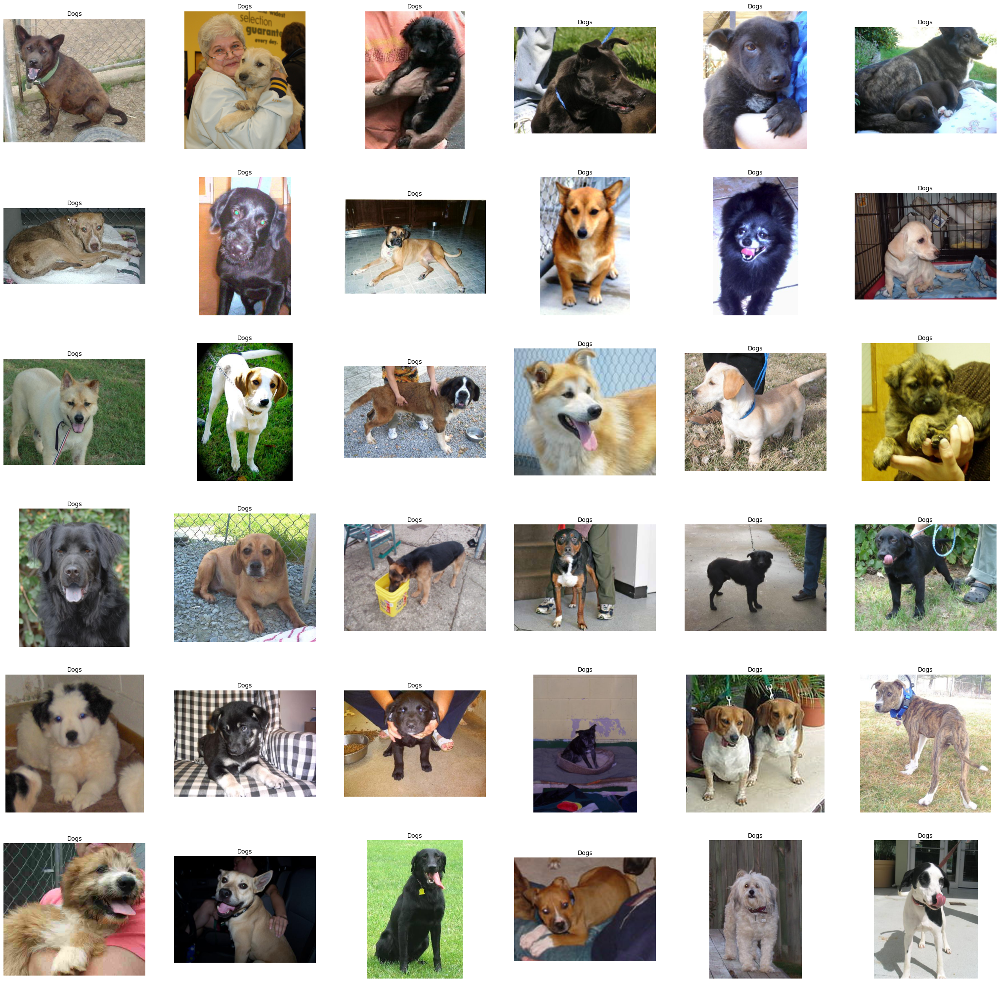

In [21]:
plt.figure(figsize=(36,36))
temp = df[df['label']==1]['images']
start = random.randint(0, len(temp))
files = temp[start:start+36]

for index, file in enumerate(files):
    plt.subplot(6,6, index+1)
    img = load_img(file)
    img = np.array(img)
    plt.imshow(img)
    plt.title('Dogs')
    plt.axis('off')

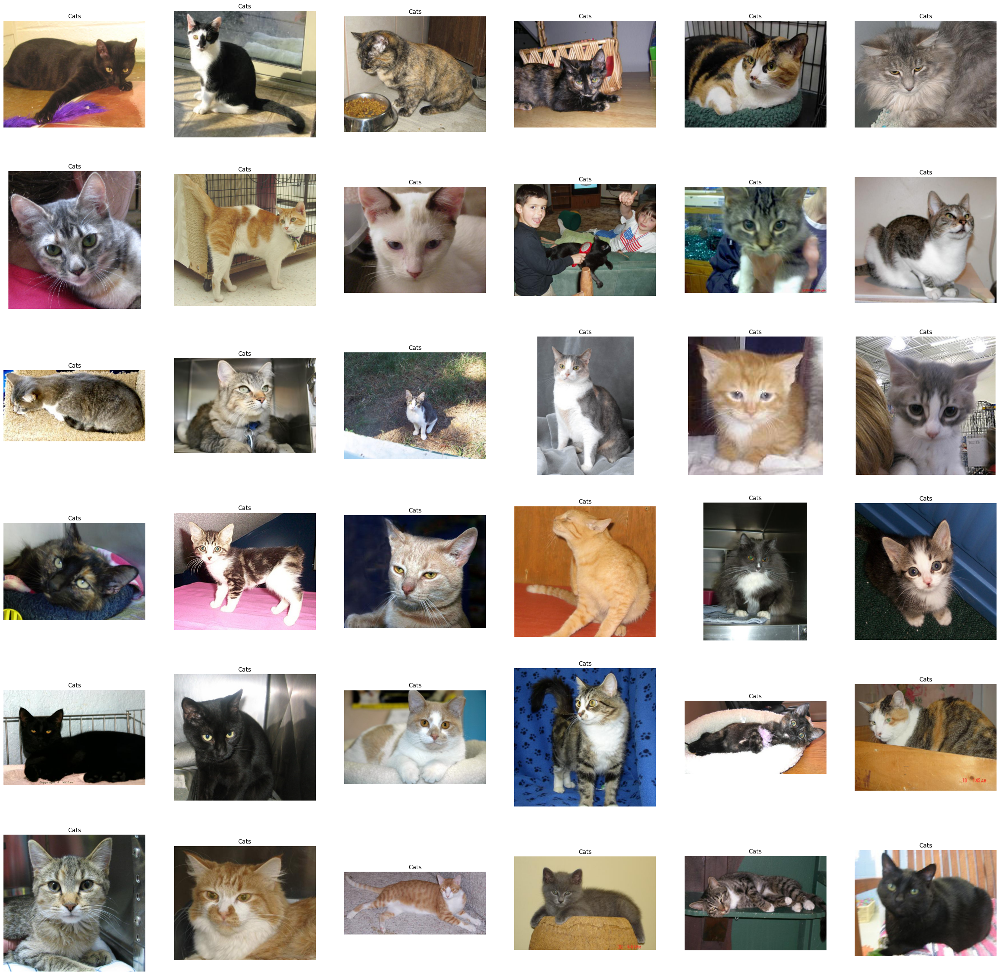

In [22]:
plt.figure(figsize=(36,36))
temp = df[df['label']==0]['images']
start = random.randint(0, len(temp))
files = temp[start:start+36]

for index, file in enumerate(files):
    plt.subplot(6,6, index+1)
    img = load_img(file)
    img = np.array(img)
    plt.imshow(img)
    plt.title('Cats')
    plt.axis('off')

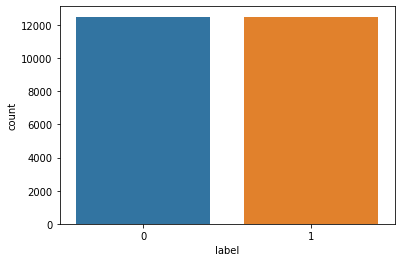

In [24]:
sns.countplot(df['label'])

In [25]:
df['label'].value_counts()

0    12499
1    12499
Name: label, dtype: int64

In [26]:
df['label'] = df['label'].astype('str')
df.head()

,images,label
0,PetImages/Cat/3545.jpg,0
1,PetImages/Cat/9515.jpg,0
2,PetImages/Dog/3744.jpg,1
3,PetImages/Cat/1686.jpg,0
4,PetImages/Cat/8608.jpg,0


In [28]:
train, test = train_test_split(df, test_size=0.2, random_state=42)

In [30]:
train_generator = ImageDataGenerator(
    rescale = 1./255,  # normalization of images
    rotation_range = 40, # augmention of images to avoid overfitting
    shear_range = 0.2,
    zoom_range = 0.2,
    horizontal_flip = True,
    fill_mode = 'nearest'
)

val_generator = ImageDataGenerator(rescale = 1./255)

train_iterator = train_generator.flow_from_dataframe(
    train,x_col='images',
    y_col='label',
    target_size=(128,128),
    batch_size=512,
    class_mode='binary'
)

val_iterator = val_generator.flow_from_dataframe(
    test,x_col='images',
    y_col='label',
    target_size=(128,128),
    batch_size=512,
    class_mode='binary'
)

Found 19998 validated image filenames belonging to 2 classes.
Found 5000 validated image filenames belonging to 2 classes.


Model Oluşturma
Dense - tek boyutlu doğrusal katman dizisi

Conv2D - 2 boyutlu evrişim katmanı

MaxPooling2D - bir sonraki katmana maksimum piksel değerini alma işlevi

Flatten - 2D diziyi 1D diziye dönüştür

Aşırı sığdırmayı önlemek için görüntülere büyütme uygulanmadıysa Dropout kullanın

activation='relu' - yaygın olarak görüntü sınıflandırma modelleri için kullanılır

input_shape=(128,128,3) - Bir RGB renk ölçeğindeki görüntülerin çözünürlük boyutu. Gri tonlamalı ise üçüncü parametre 1'dir.

activation='sigmoid' - ikili sınıflandırma için kullanılır



In [31]:
from keras import Sequential
from keras.layers import Conv2D, MaxPool2D, Flatten, Dense

model = Sequential([
            Conv2D(16, (3,3), activation='relu', input_shape=(128,128,3)),
            MaxPool2D((2,2)),
            Conv2D(32, (3,3), activation='relu'),
            MaxPool2D((2,2)),
            Conv2D(64, (3,3), activation='relu'),
            MaxPool2D((2,2)),
            Flatten(),
            Dense(512, activation='relu'),
            Dense(1, activation='sigmoid')
]) 

model.compile() -  modelin derlenmesi

optimizer='adam' - modelin öğrenme oranını hayır üzerinden otomatik olarak ayarlar. çağların

loss='binary_crossentropy' - ikili çıktılar için kayıp fonksiyonu

In [32]:
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 126, 126, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 63, 63, 16)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 61, 61, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 30, 30, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 28, 28, 64)        18496     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 14, 14, 64)       0

Training accuracy and validation accuracy her yinelemeyi artırır
Training loss and validation loss her yinelemeyi azaltır

In [35]:
history = model.fit(train_iterator, epochs=10, validation_data=val_iterator)

Epoch 1/10
40/40 [==============================] - 424s 11s/step - loss: 0.6481 - accuracy: 0.6218 - val_loss: 0.6187 - val_accuracy: 0.6722
Epoch 2/10
40/40 [==============================] - 431s 11s/step - loss: 0.6021 - accuracy: 0.6772 - val_loss: 0.5714 - val_accuracy: 0.6992
Epoch 3/10
40/40 [==============================] - 429s 11s/step - loss: 0.5638 - accuracy: 0.7089 - val_loss: 0.5439 - val_accuracy: 0.7268
Epoch 4/10
40/40 [==============================] - 435s 11s/step - loss: 0.5477 - accuracy: 0.7203 - val_loss: 0.5165 - val_accuracy: 0.7448
Epoch 5/10
40/40 [==============================] - 418s 10s/step - loss: 0.5276 - accuracy: 0.7377 - val_loss: 0.5008 - val_accuracy: 0.7544
Epoch 6/10
40/40 [==============================] - 419s 10s/step - loss: 0.5098 - accuracy: 0.7474 - val_loss: 0.4952 - val_accuracy: 0.7596
Epoch 7/10
40/40 [==============================] - 415s 10s/step - loss: 0.4899 - accuracy: 0.7639 - val_loss: 0.4768 - val_accuracy: 0.7736
Epoch 

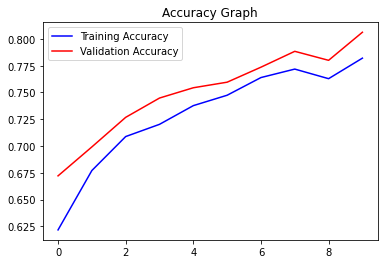

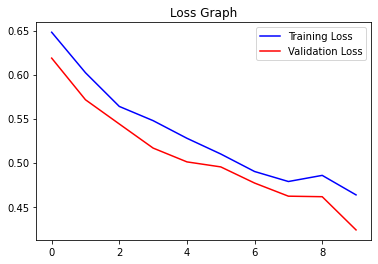

In [36]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
epochs = range(len(acc))

plt.plot(epochs, acc, 'b', label='Training Accuracy')
plt.plot(epochs, val_acc, 'r', label='Validation Accuracy')
plt.title('Accuracy Graph')
plt.legend()
plt.figure()

loss = history.history['loss']
val_loss = history.history['val_loss']
plt.plot(epochs, loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Loss Graph')
plt.legend()
plt.show()